In [1]:
#libraries 
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from tweepy.streaming import StreamListener
import time
from tweepy import OAuthHandler
from tweepy import API
from tweepy import Stream
import sys
import json


API and scrape

In [2]:
consumer_key =  'vezezGSjD1a8ayKiD2f66tRfD'
consumer_secret = 'OpCrhVSsGY2sqlko4w6bcj07Wheq9wApLRyvcYIvMTjzAnMPbv'
access_token = '1475282070339391489-rKunMuAUHDba2RyL5lEoDFYEGc453Z'
access_token_secret = 'BV4bF17lOeeBSflQtYBJwpYeMP1mmL3qPGOeNAjhjqM9y'

auth = OAuthHandler(consumer_key= consumer_key, consumer_secret=consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = API(auth)


In [3]:
tweets = []

class CustomStreamListener(StreamListener):
    def __init__(self, api):
        self.api = api
        super(StreamListener, self).__init__()

        self.tweets = tweets

    def on_data(self, tweet):
        self.tweets.append(json.loads(tweet))
        print(tweet)
        # save_file.write(str(tweet))

for streaming use filter endpoint (keywords, userids, loc)

In [4]:
listen = CustomStreamListener(api)
stream = Stream(auth,listen)


In [5]:
key_words_to_track = ['#GarongKorupsiBerjamaah','BPJS','#GangsterIstana'] # write list of hashtags or other keywords

In [6]:
stream.filter(track=key_words_to_track)

{"created_at":"Mon Feb 07 06:09:04 +0000 2022","id":1490568274471710722,"id_str":"1490568274471710722","text":"Buat yg bingung knp  bpjs bnyak yg ngeributin: bapak sy dokter, ga dibayar berbulan2 gara2 bpjs ga bs bayar. Plus e\u2026 https:\/\/t.co\/BN4IVVNjOF","source":"\u003ca href=\"http:\/\/twitter.com\/download\/iphone\" rel=\"nofollow\"\u003eTwitter for iPhone\u003c\/a\u003e","truncated":true,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":76396048,"id_str":"76396048","name":"Sultan","screen_name":"agunkperkasa","location":"Surabaya - Jakarta","url":"http:\/\/agunkperkasa.blogspot.com\/","description":"full time dumber | slash chord lover | nice photographer | http:\/\/flickr.com\/photos\/agunkpe\u2026 | agungperkasa.n@gmail.com |","translator_type":"none","protected":false,"verified":false,"followers_count":602,"friends_count":741,"listed_count":4,"favourites_count"

KeyboardInterrupt: ignored

In [7]:
tweets

[{'contributors': None,
  'coordinates': None,
  'created_at': 'Mon Feb 07 06:09:04 +0000 2022',
  'entities': {'hashtags': [],
   'symbols': [],
   'urls': [{'display_url': 'twitter.com/i/web/status/1…',
     'expanded_url': 'https://twitter.com/i/web/status/1490568274471710722',
     'indices': [117, 140],
     'url': 'https://t.co/BN4IVVNjOF'}],
   'user_mentions': []},
  'extended_tweet': {'display_text_range': [0, 191],
   'entities': {'hashtags': [],
    'symbols': [],
    'urls': [],
    'user_mentions': []},
   'full_text': 'Buat yg bingung knp  bpjs bnyak yg ngeributin: bapak sy dokter, ga dibayar berbulan2 gara2 bpjs ga bs bayar. Plus emg biaya bpjsnya dikorupsi sm negara. Selalu ada yg bahagia jg ada yg sedih.'},
  'favorite_count': 0,
  'favorited': False,
  'filter_level': 'low',
  'geo': None,
  'id': 1490568274471710722,
  'id_str': '1490568274471710722',
  'in_reply_to_screen_name': None,
  'in_reply_to_status_id': None,
  'in_reply_to_status_id_str': None,
  'in_reply_

Flatten add replies

In [8]:
def flatten_tweets(tweets):
    """ Flattens out tweet dictionaries so relevant JSON is 
        in a top-level dictionary. """
    
    tweets_list = []
    
    # Iterate through each tweet
    for tweet_obj in tweets:
    
        ''' User info'''
        # Store the user screen name in 'user-screen_name'
        tweet_obj['user-screen_name'] = tweet_obj['user']['screen_name']
        
        # Store the user location
        tweet_obj['user-location'] = tweet_obj['user']['location']
    
        ''' Text info'''
        # Check if this is a 140+ character tweet
        if 'extended_tweet' in tweet_obj:
            # Store the extended tweet text in 'extended_tweet-full_text'
            tweet_obj['extended_tweet-full_text'] = \
                                    tweet_obj['extended_tweet']['full_text']
    
        if 'retweeted_status' in tweet_obj:
            # Store the retweet user screen name in 
            # 'retweeted_status-user-screen_name'
            tweet_obj['retweeted_status-user-screen_name'] = \
                        tweet_obj['retweeted_status']['user']['screen_name']

            # Store the retweet text in 'retweeted_status-text'
            tweet_obj['retweeted_status-text'] = \
                                        tweet_obj['retweeted_status']['text']
    
            if 'extended_tweet' in tweet_obj['retweeted_status']:
                # Store the extended retweet text in 
                #'retweeted_status-extended_tweet-full_text'
                tweet_obj['retweeted_status-extended_tweet-full_text'] = \
                tweet_obj['retweeted_status']['extended_tweet']['full_text']
                
        if 'quoted_status' in tweet_obj:
            # Store the retweet user screen name in 
            #'retweeted_status-user-screen_name'
            tweet_obj['quoted_status-user-screen_name'] = \
                            tweet_obj['quoted_status']['user']['screen_name']

            # Store the retweet text in 'retweeted_status-text'
            tweet_obj['quoted_status-text'] = \
                                            tweet_obj['quoted_status']['text']
    
            if 'extended_tweet' in tweet_obj['quoted_status']:
                # Store the extended retweet text in 
                #'retweeted_status-extended_tweet-full_text'
                tweet_obj['quoted_status-extended_tweet-full_text'] = \
                    tweet_obj['quoted_status']['extended_tweet']['full_text']
        



      
        
        ''' Place info'''
        if 'place' in tweet_obj:
            # Store the country code in 'place-country_code'
            try:
                tweet_obj['place-country'] = \
                                            tweet_obj['place']['country']
                
                tweet_obj['place-country_code'] = \
                                            tweet_obj['place']['country_code']
                
                tweet_obj['location-coordinates'] = \
                            tweet_obj['place']['bounding_box']['coordinates']
            except: pass
        
        tweets_list.append(tweet_obj)
        
    return tweets_list
    

Data Frame

In [69]:
tweets_flat = flatten_tweets(tweets)

In [70]:
ds_tweets = pd.DataFrame(tweets_flat)

# Print out the first 5 tweets from this dataset
print(ds_tweets['text'].values[0:5])

['Buat yg bingung knp  bpjs bnyak yg ngeributin: bapak sy dokter, ga dibayar berbulan2 gara2 bpjs ga bs bayar. Plus e… https://t.co/BN4IVVNjOF'
 'RT @Sofianpalupi: Kemarin nahan tangis di IGD. Keluarga pasien bilang: \n"BPJS baik ya, anak saya bisa berobat gratis. Tanpa itu, saya ga ak…'
 'RT @Sofianpalupi: Kemarin nahan tangis di IGD. Keluarga pasien bilang: \n"BPJS baik ya, anak saya bisa berobat gratis. Tanpa itu, saya ga ak…'
 '@Tatum_alattas Bansos banyak yg tidak terlacak apa madam Bansos itu cuma fiksi\n#GarongKorupsiBerjamaah \n#GarongKorupsiBerjamaah'
 'RT @Sofianpalupi: Kemarin nahan tangis di IGD. Keluarga pasien bilang: \n"BPJS baik ya, anak saya bisa berobat gratis. Tanpa itu, saya ga ak…']


In [71]:
ds_tweets.tail()

,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,is_quote_status,extended_tweet,quote_count,reply_count,retweet_count,favorite_count,entities,favorited,retweeted,filter_level,lang,timestamp_ms,user-screen_name,user-location,extended_tweet-full_text,quoted_status-user-screen_name,quoted_status-text,quoted_status-extended_tweet-full_text,retweeted_status,retweeted_status-user-screen_name,retweeted_status-text,retweeted_status-extended_tweet-full_text,display_text_range,extended_entities,possibly_sensitive,place-country,place-country_code,location-coordinates
1104,Mon Feb 07 07:26:18 +0000 2022,1490587709357756417,1490587709357756417,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,NaN,None,NaN,None,None,"{'id': 157989446, 'id_str': '157989446', 'name...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644218778348,diariumbi,Ata Ta Tiga,NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN
1105,Mon Feb 07 07:26:20 +0000 2022,1490587720049397760,1490587720049397760,@BPJSKesehatanRI \nSore kak\nSaya Mau tanya\nK...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,1.522338e+09,1522337929,BPJSKesehatanRI,"{'id': 1488684728836575232, 'id_str': '1488684...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644218780897,hestihesty22,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1106,Mon Feb 07 07:26:22 +0000 2022,1490587727670448135,1490587727670448135,#GarongKorupsiBerjemaah \nMau jadi gubernur IK...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,None,None,"{'id': 1471978903153479681, 'id_str': '1471978...",None,None,None,None,1.490460e+18,1490459773556641793,{'created_at': 'Sun Feb 06 22:57:56 +0000 2022...,"{'url': 'https://t.co/HwmRuCe5CT', 'expanded':...",True,NaN,0,0,0,0,{'hashtags': [{'text': 'GarongKorupsiBerjemaah...,False,False,low,in,1644218782714,dwiyantilagi,None,NaN,Dina4rtya,"Pertamina Rugi Rp 11 Triliun, Ahok Dicibir Sam...","Pertamina Rugi Rp 11 Triliun, Ahok Dicibir Sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1107,Mon Feb 07 07:26:31 +0000 2022,1490587764555120640,1490587764555120640,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""https://mobile.twitter.com"" rel=""nofo...",False,NaN,None,NaN,None,None,"{'id': 1086411494990827522, 'id_str': '1086411...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644218791508,clapclapbichh,None,NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN
1108,Mon Feb 07 07:26:32 +0000 2022,1490587768090611713,1490587768090611713,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,None,None,"{'id': 896768605894737920, 'id_str': '89676860...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644218792351,cpt_pahlevi,inyourworld,NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
import numpy as np


In [75]:
#clean
ds_tweets.head()
ds_tweets['in_reply_to_screen_name'].fillna(value=np.nan, inplace=True)
#ds_tweets['reply_to_screen_name'] = ds_tweets['in_reply_to_screen_name'].replace([None], np.nan)


In [77]:
ds_tweets.head()

,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,is_quote_status,extended_tweet,quote_count,reply_count,retweet_count,favorite_count,entities,favorited,retweeted,filter_level,lang,timestamp_ms,user-screen_name,user-location,extended_tweet-full_text,quoted_status-user-screen_name,quoted_status-text,quoted_status-extended_tweet-full_text,retweeted_status,retweeted_status-user-screen_name,retweeted_status-text,retweeted_status-extended_tweet-full_text,display_text_range,extended_entities,possibly_sensitive,place-country,place-country_code,location-coordinates,reply_to_screen_name
0,Mon Feb 07 06:09:04 +0000 2022,1490568274471710722,1490568274471710722,Buat yg bingung knp bpjs bnyak yg ngeributin:...,"<a href=""http://twitter.com/download/iphone"" r...",True,NaN,None,NaN,None,NaN,"{'id': 76396048, 'id_str': '76396048', 'name':...",None,None,None,None,1.490138e+18,1490137897542230019,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,"{'url': 'https://t.co/0XQOwUotE1', 'expanded':...",True,{'full_text': 'Buat yg bingung knp bpjs bnyak...,0,0,0,0,"{'hashtags': [], 'urls': [{'url': 'https://t.c...",False,False,low,in,1644214144710,agunkperkasa,Surabaya - Jakarta,Buat yg bingung knp bpjs bnyak yg ngeributin:...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Mon Feb 07 06:09:08 +0000 2022,1490568291751845895,1490568291751845895,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,None,NaN,"{'id': 351455796, 'id_str': '351455796', 'name...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644214148830,Defian415,Indonesia,NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Mon Feb 07 06:09:09 +0000 2022,1490568293727768577,1490568293727768577,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,None,NaN,"{'id': 87620811, 'id_str': '87620811', 'name':...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644214149301,beMY_ace,"Jakarta Selatan, DKI Jakarta",NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pasien b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Mon Feb 07 06:09:15 +0000 2022,1490568318746783744,1490568318746783744,@Tatum_alattas Bansos banyak yg tidak terlacak...,"<a href=""http://twitter.com/download/android"" ...",False,1.490566e+18,1490565837136318465,1.424352e+18,1424351866075238406,Tatum_alattas,"{'id': 1489917810067533827, 'id_str': '1489917...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,{'hashtags': [{'text': 'GarongKorupsiBerjamaah...,False,False,low,in,1644214155266,Hilang8281,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[15, 127]",NaN,NaN,NaN,NaN,NaN,Tatum_alattas
4,Mon Feb 07 06:09:34 +0000 2022,1490568398404603906,1490568398404603906,RT @Sofianpalupi: Kemarin nahan tangis di IGD....,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,None,NaN,"{'id': 925362723927371776, 'id_str': '92536272...",None,None,None,None,NaN,NaN,NaN,NaN,False,NaN,0,0,0,0,"{'hashtags': [], 'urls': [], 'user_mentions': ...",False,False,low,in,1644214174258,Luchikim_20,None,NaN,NaN,NaN,NaN,{'created_at': 'Sun Feb 06 01:38:54 +0000 2022...,Sofianpalupi,Kemarin nahan tangis di IGD. Keluarga pasien b...,Kemarin nahan tangis di IGD. Keluarga pa

In [13]:
ds_tweets.to_csv('ds_tweets')

##Network

In [131]:
G_rt = nx.from_pandas_edgelist(
    ds_tweets,
    source = 'user-screen_name',
    target = 'retweeted_status-user-screen_name',
    create_using = nx.DiGraph())
 
# Print the number of nodes
print('Nodes in RT network:', len(G_rt.nodes()))

# Print the number of edges
print('Edges in RT network:', len(G_rt.edges()))

Nodes in RT network: 821
Edges in RT network: 987


In [132]:
G_reply = nx.from_pandas_edgelist(
    ds_tweets,
    source = 'user-screen_name',
    target = 'in_reply_to_screen_name',
    create_using = nx.DiGraph())
    
# Print the number of nodes
print('Nodes in reply network:', len(G_reply.nodes()))

# Print the number of edges
print('Edges in reply network:', len(G_reply.edges()))

Nodes in reply network: 758
Edges in reply network: 745


In [133]:
# in_deg = G_rt.in_degree()
# to_remove = [n for (n, deg) in in_deg if deg < 0.05]
# G_rt.remove_nodes_from(to_remove)


Viz network

In [134]:
import math

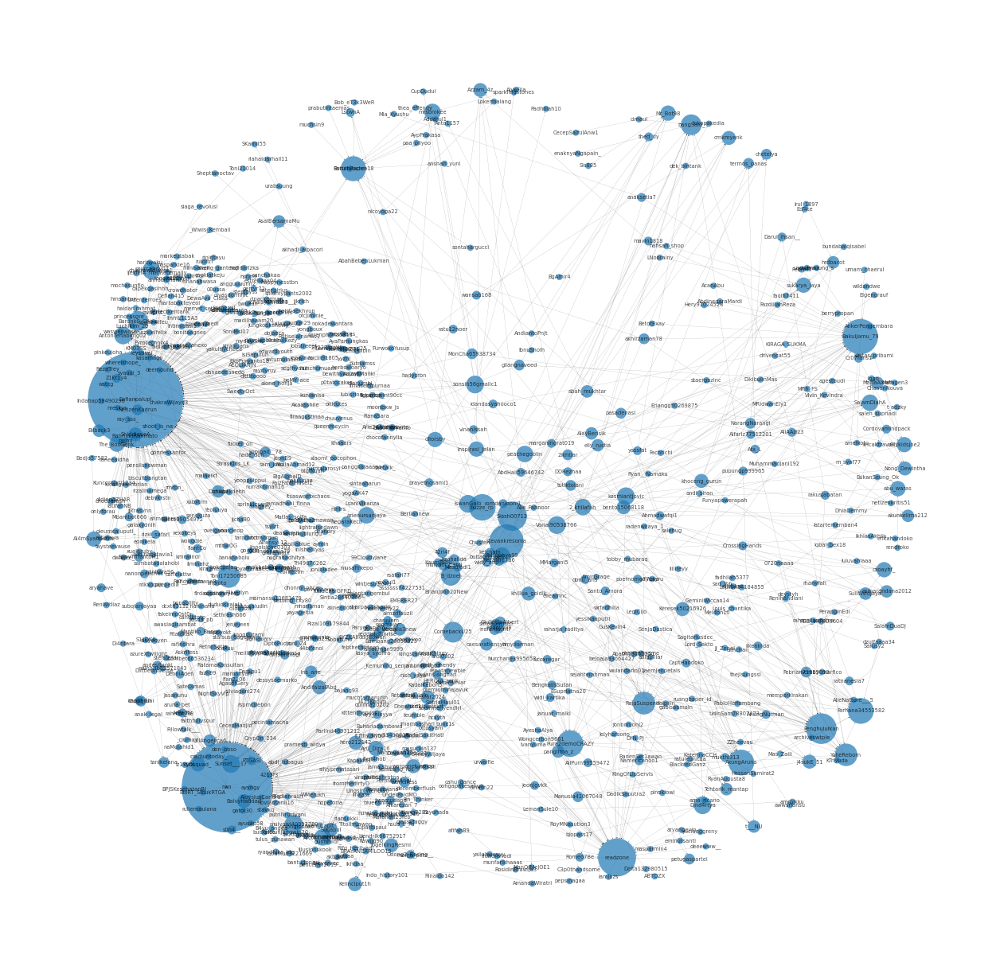

In [139]:
from matplotlib.pyplot import figure
import math
figure(figsize=(20, 20), dpi=80)

# Create random layout positions
pos = nx.spring_layout(G_rt,k=5/math.sqrt(G_rt.order()))

pos2 = nx.spectral_layout(G_rt)
# Create size list
sizes = [x[1]*50 for x in G_rt.degree()]

# Draw the network
nx.draw_networkx(G_rt, pos=pos, 
    with_labels = True, 
    node_size = sizes,
    font_size =  6,
    width = 0.1, alpha = 0.7,
    arrowsize = 2, linewidths = 0)

# Turn axis off and show
plt.axis('off')
plt.show()

Indegree centrality

In [81]:
# Generate in-degree centrality for retweets 
column_names = ['screen_name', 'degree']
rt_centrality = nx.in_degree_centrality(G_rt)


# Generate in-degree centrality for replies 
reply_centrality = nx.in_degree_centrality(G_reply)

# Store centralities in DataFrame
rt = pd.DataFrame(list(rt_centrality.items()), columns = column_names)
reply = pd.DataFrame(list(reply_centrality.items()), columns = column_names)
rt
# Print first five results in descending order of centrality
print('rt')
print(rt.sort_values('degree', ascending = False).head())

# Print first five results in descending order of centrality
print('reply')
print(reply.sort_values('degree', ascending = False).head())

rt
      screen_name    degree
3    Sofianpalupi  0.284146
1             NaN  0.253659
21       readzone  0.045122
114  BakulJamu_79  0.039024
41   Penghuluikan  0.029268
reply
         screen_name    degree
1                NaN  0.850727
173     Sofianpalupi  0.010568
41   BPJSKesehatanRI  0.009247
211        Mail21man  0.006605
217     Penghuluikan  0.005284


betweeness centrality

In [84]:
# Generate betweenness centrality for retweets 
rt_centrality = nx.betweenness_centrality(G_rt)

# Generate betweenness centrality for replies 
reply_centrality = nx.betweenness_centrality(G_reply)

# Store centralities in data frames
rt = pd.DataFrame(list(rt_centrality.items()), columns = column_names)
reply = pd.DataFrame(list(reply_centrality.items()), columns = column_names)

print('retweet')
# Print first five results in descending order of centrality
print(rt.sort_values('degree', ascending = False).head())

print('reply')
# Print first five results in descending order of centrality
print(reply.sort_values('degree', ascending = False).head())

retweet
        screen_name    degree
112  Pura2demoCRAZY  0.000072
199     ComebackU25  0.000068
162    RajaSuspend_  0.000043
377    aniesfor2024  0.000038
95       panglima_z  0.000030
reply
         screen_name    degree
41   BPJSKesehatanRI  0.000033
309        44bifenol  0.000003
282        worksfess  0.000003
64         DenniAden  0.000003
4         Hilang8281  0.000002


ratio

In [85]:
# Calculate in-degrees and store in DataFrame
degree_rt = pd.DataFrame(list(G_rt.in_degree()), columns = column_names)
degree_reply = pd.DataFrame(list(G_reply.in_degree()), columns = column_names)

# Merge the two DataFrames on screen name
ratio = degree_rt.merge(degree_reply, on = 'screen_name', suffixes = ('_rt', '_reply'))

# Calculate the ratio
ratio['ratio'] = ratio['degree_reply'] / ratio['degree_rt']

# Exclude any tweets with less than 5 retweets
ratio = ratio[ratio['degree_rt'] >= 5]

# Print out first five with highest ratio
print(ratio.sort_values('ratio', ascending = False).head())

      screen_name  degree_rt  degree_reply     ratio
1             NaN        208           644  3.096154
47     Ayu_Dira16          5             1  0.200000
35   Penghuluikan         24             4  0.166667
246       B_dzoel          6             1  0.166667
62     SalamDiahA          7             1  0.142857


Time series